In [6]:
import cv2
import math
import time
import numpy as np
import random as rng
from matplotlib import pyplot as plt
from IPython.display import display, HTML,clear_output
%matplotlib inline

In [16]:
im = cv2.imread('senior/IMG_9507.JPG')

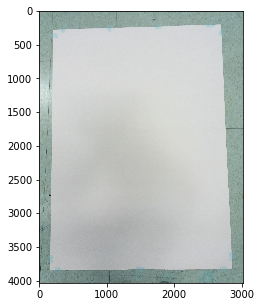

In [51]:
plt.figure(figsize=(5,5))
plt.imshow(im)
plt.show()

In [59]:
tl=[276,207]
tr=[199,2698]
bl=[3839,163]
br=[3817,2866]

In [232]:
def drawline(p1,p2,pic,color=[255,0,0]):
    [y1,x1] = p1
    [y2,x2] = p2
    #y = mx + c
    if x1==x2:
        for i in range(pic.shape[0]):
            pic[i,x1] = np.array(color,dtype="uint8")
        return
    if y1==y2:
        for i in range(pic.shape[1]):
            pic[y1,i] = np.array(color,dtype="uint8")
        return
    m = (y1-y2)/(x1-x2)
    c = y1-m*x1
#      = -c/m 
#     lastx = (pic.shape[0]-1-c)/m
    if abs(m) <= 1:
        for i in range(pic.shape[1]):
            yy = int(m*i+c)
            if yy < 0 or yy >= pic.shape[0]:
                continue
            for k1 in range(-2,3):
                for k2 in range(-2,3):
                    if 0 <= yy+k1 and yy+k1 < pic.shape[0] and 0 <= i+k2 and i+k2 < pic.shape[1]:
                        pic[yy,i] = np.array(color,dtype="uint8")
    else:
        for i in range(pic.shape[0]):
            xx = int((i-c)/m)
            if xx < 0 or xx >= pic.shape[1]:
                continue
            for k1 in range(-2,3):
                for k2 in range(-2,3):
                    if 0 <= i+k1 and i+k1 < pic.shape[0] and 0 <= xx+k2 and xx+k2 < pic.shape[1]:
                        pic[i,xx] = np.array(color,dtype="uint8")

In [209]:
pic2 = im.copy()

In [210]:
drawline(tl,tr,pic2)
drawline(tl,bl,pic2)
drawline(br,tr,pic2)
drawline(bl,br,pic2)

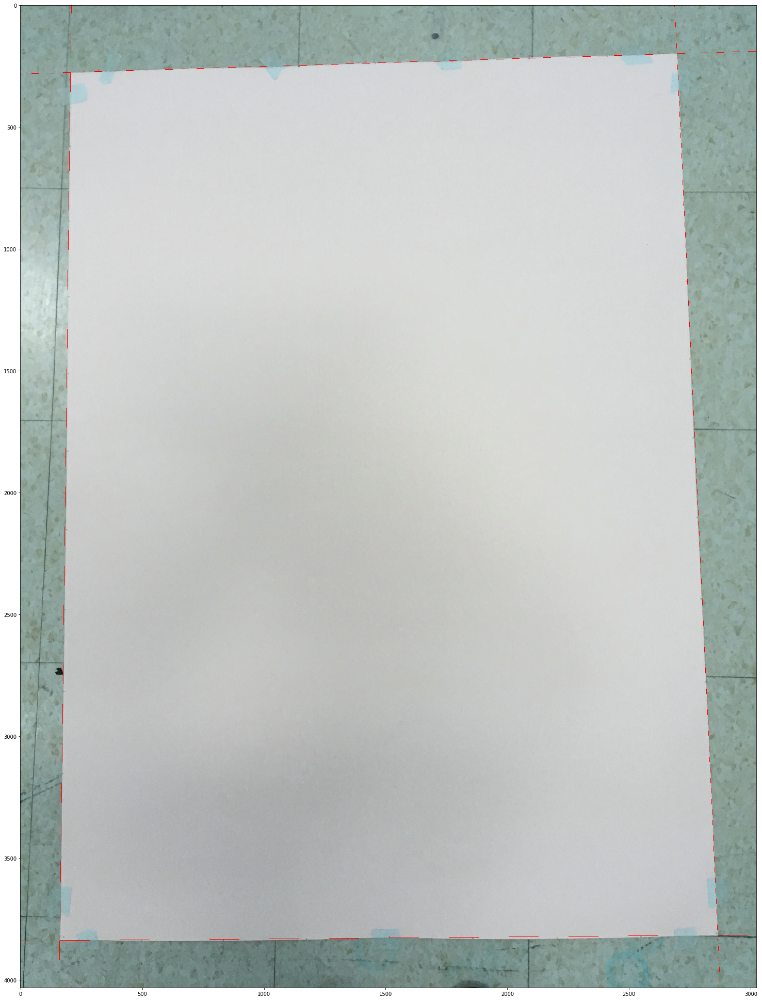

In [211]:
plt.figure(figsize=(35,35))
plt.imshow(pic2)
plt.show()

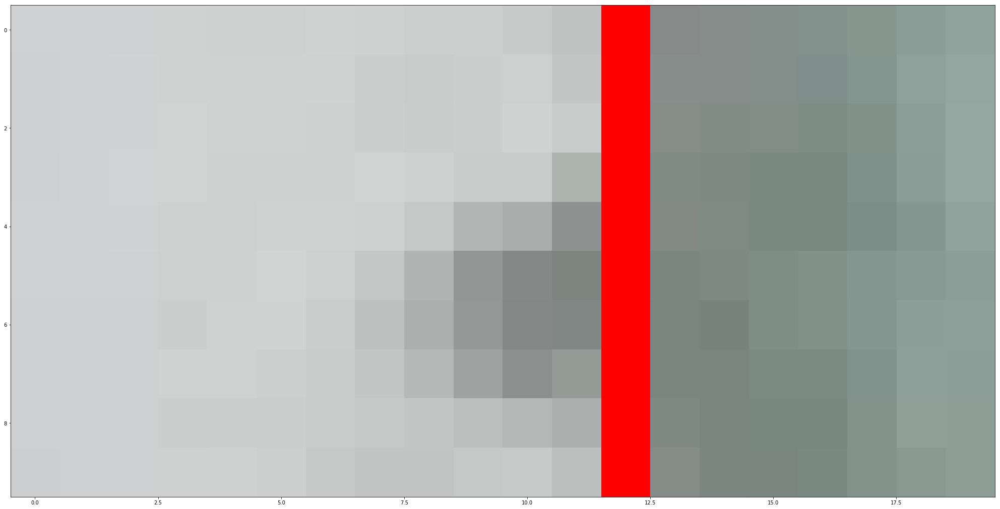

In [212]:
plt.figure(figsize=(35,35))
plt.imshow(pic[2770:2780,2805:2825])
plt.show()

In [213]:
u = [[265,520],[256,831],[250,1144],[237,1459],[227,1775],[215,2091],[207,2410]]
d = [[3840,498,],[3840,834],[3834,1176],[3826,1516],[3831,1859],[3831,2206],[3825,2550]]
l = [[576,202],[885,198],[1195,194],[1509,191],[1829,187],[2152,185],[2480,183],[2815,177],
     [3153,173],[3495,169]]
r = [[505,2714],[816,2728],[1132,2741],[1452,2754],[1775,2768],[2103,2784],[2437,2800],
     [2776,2817],[3121,2835],[3471,2850]]

In [214]:
pic = pic2.copy()
for i in range(len(u)):
    drawline(u[i],d[i],pic)
for i in range(len(l)):
    drawline(l[i],r[i],pic)

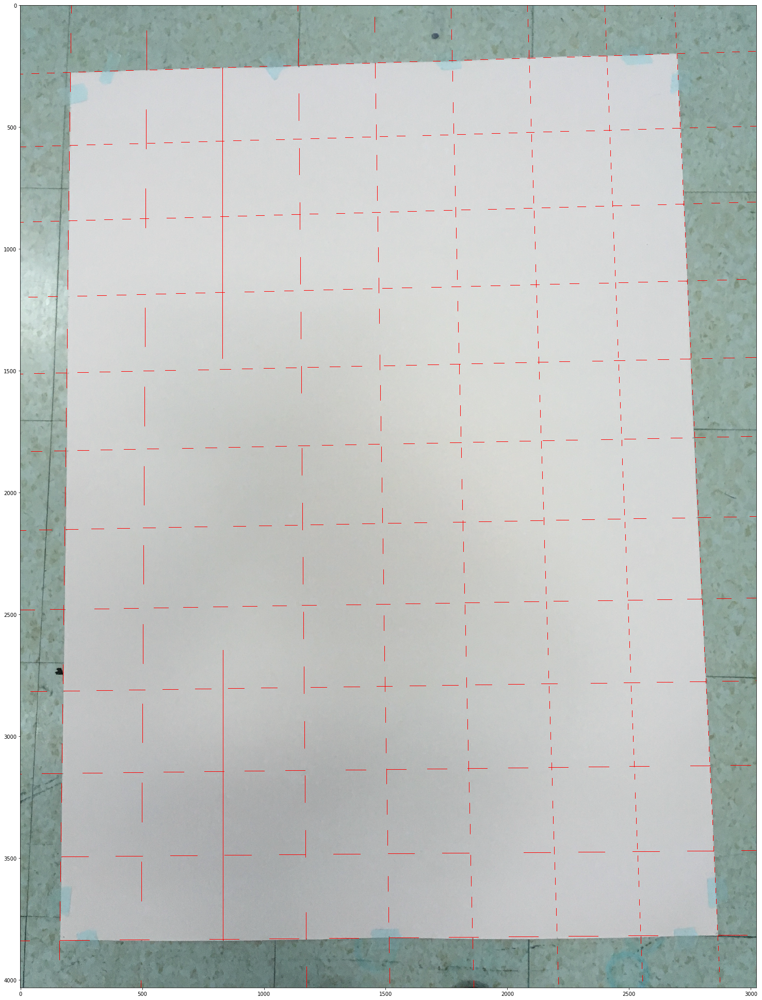

In [215]:
plt.figure(figsize=(35,35))
plt.imshow(pic)
plt.show()

In [461]:
ratio = 1/3
small = cv2.resize(im, (0,0), fx=ratio, fy=ratio)

In [462]:
tl = np.array(tl, dtype='int64')
tr = np.array(tr, dtype='int64')
bl = np.array(bl, dtype='int64')
br = np.array(br, dtype='int64')
drawline(tl*ratio,tr*ratio,small)
drawline(tl*ratio,bl*ratio,small)
drawline(br*ratio,tr*ratio,small)
drawline(bl*ratio,br*ratio,small)
l = np.array(l,dtype='int64')
r = np.array(r,dtype='int64')
u = np.array(u,dtype='int64')
d = np.array(d,dtype='int64')
for i in range(len(u)):
    drawline(u[i]*ratio,d[i]*ratio,small)
for i in range(len(l)):
    drawline(l[i]*ratio,r[i]*ratio,small)

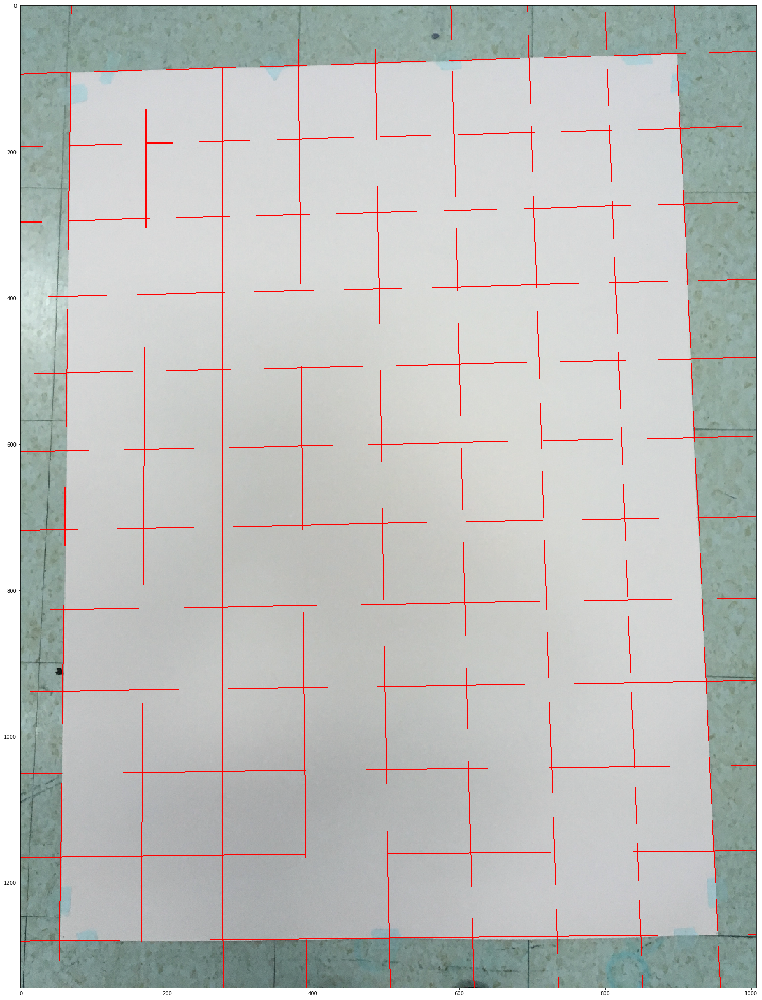

In [463]:
plt.figure(figsize=(35,35))
plt.imshow(small)
plt.show()

In [464]:
x = np.array([1,2,3], dtype='int64')

In [465]:
#A0 size 1099 x 790.5 mm
s1 = 1099
s2 = 790.5

In [466]:
def divline(p1,p2,ratio): #ratio in (0,1) close to p1
    [y1,x1] = p1
    [y2,x2] = p2
    rratio = 1-ratio
    x = int(x1*rratio + x2*ratio)
    y = int(y1*rratio + y2*ratio)
    return [y,x]
    

In [467]:
est_l = []
est_r = []
est_u = []
est_d = []
for i in range(s1//100):
    est_l.append(divline(tl,bl,(i+1)*100/s1))
    est_r.append(divline(tr,br,(i+1)*100/s1))
for i in range(int(s2)//100):
    est_u.append(divline(tl,tr,(i+1)*100/s2))
    est_d.append(divline(bl,br,(i+1)*100/s2))

In [468]:
est_l = np.array(est_l,dtype='int64')
est_r = np.array(est_r,dtype='int64')
est_u = np.array(est_u,dtype='int64')
est_d = np.array(est_d,dtype='int64')

In [469]:
for i in range(len(est_l)):
    drawline(est_l[i]*ratio,est_r[i]*ratio,small,[0,255,0])
for i in range(len(est_u)):
    drawline(est_u[i]*ratio,est_d[i]*ratio,small,[0,255,0])
    

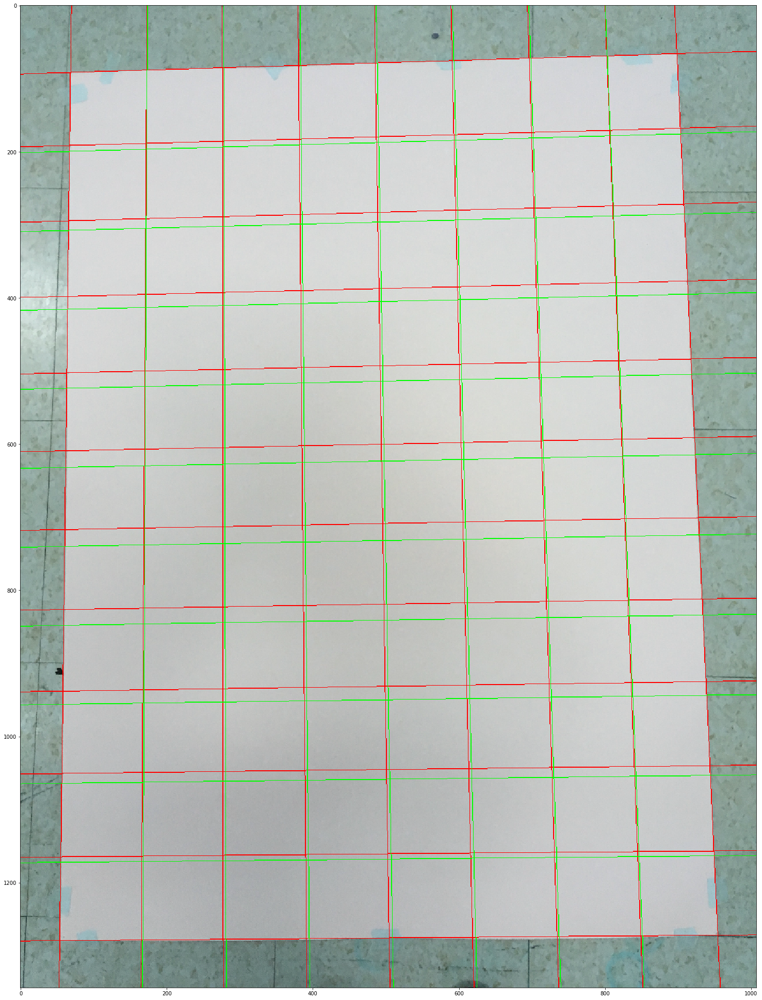

In [470]:
plt.figure(figsize=(35,35))
plt.imshow(small)
plt.show()

In [471]:
def dist(p1,p2):
    return ((p1[0]-p2[0])**2+(p1[1]-p2[1])**2)**0.5

for i in range(len(l)-1):
    print(dist(l[i],l[i+1]),dist(r[i],r[i+1]))
#     print("        ",abs(l[i][0]-l[i+1][0]),abs(est_l[i][0]-est_l[i+1][0]))
    

309.02588888311607 311.3149530620076
310.0258053775524 316.26729201736936
314.0143308831621 320.2639536382451
320.0249990235138 323.3032632065442
323.0061918911153 328.3900120283807
328.0060975042995 334.38301392265726
335.0537270349339 339.42598604113977
338.02366781040644 345.469246098694
342.023391012954 350.3212811120672


In [473]:
dist(bl,d[0])

335.0014925339886

In [474]:
bl

array([3839,  163])

In [475]:
d[0]

array([3840,  498])

In [476]:
for i in range(len(l)-1):
    print(l[i+1][0]-l[i][0], r[i+1][0]-r[i][0])
    print('###',est_l[i+1][0]-est_l[i][0], r[i+1][0]-r[i][0])
#     print((l[i+2][0]-l[i+1][0])/(l[i+1][0]-l[i][0]))

309 311
### 324 311
310 316
### 324 316
314 320
### 324 320
320 323
### 325 323
323 328
### 324 328
328 334
### 324 334
335 339
### 324 339
338 345
### 324 345
342 350
### 325 350


In [477]:
pic.shape

(4032, 3024, 3)

In [478]:
3940,1529
3435,1527
2957,1526
im2 = cv2.imread("senior/IMG_4995.JPG")

In [479]:
3940*3435/(2*3940-3435)

3044.7469066366702

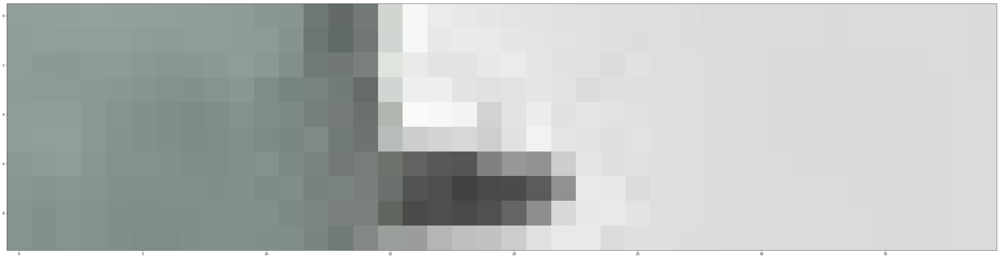

In [480]:

plt.figure(figsize=(55,55))
plt.imshow(im2[2950:2960,1510:1550])
plt.show()

In [481]:
def findpointX(py,p1,p2):
    [y1,x1]=p1
    [y2,x2]=p2
    if x1==x2:
        return [py,x1]
    m = (y2-y1)/(x2-x1)
    c = y1-m*x1
    return [py,(py-c)/m]

def findpointY(px,p1,p2):
    [y1,x1]=p1
    [y2,x2]=p2
    if y1==y2:
        return [y1,px]
    m = (y2-y1)/(x2-x1)
    c = y1-m*x1
    return [m*px+c,px]


In [482]:
newestl = [l[len(l)-1],l[len(l)-2],l[len(l)-3]]
acc = 0
for i in range(len(l)-3):
    l1 = newestl[i][0]
    l2 = newestl[i+1][0]
    l3 = newestl[i+2][0]
    l21 = l1-l2
    l32 = l2-l3
    acc = l21*l32/(l21*2-l32)
    esty = l3-acc
    print(acc)
#     print(l21*l32/(l21*(i+2)-(1+i)*l32),l[len(l)-3-i][0]-l[len(l)-4-i][0])
    newestl.append(findpointX(esty,tl,bl))
newestl

334.09248554913296
330.27428571428584
326.5423728813559
322.89385474860336
319.3259668508288
315.8360655737705
312.42162162162157


[array([3495,  169]),
 array([3153,  173]),
 array([2815,  177]),
 [2480.907514450867, 179.77127964192024],
 [2150.6332287365813, 183.84988434902905],
 [1824.0908558552253, 187.88240312724392],
 [1501.1970011066219, 191.86986582972457],
 [1181.8710342557931, 195.81326817085184],
 [866.0349686820226, 199.71357321863346],
 [553.6133470604011, 203.57171280643908]]

In [483]:
newestr = [r[len(l)-1],r[len(l)-2],r[len(l)-3]]
acc = 0
for i in range(len(l)-3):
    l1 = newestr[i][0]
    l2 = newestr[i+1][0]
    l3 = newestr[i+2][0]
    l21 = l1-l2
    l32 = l2-l3
    acc = l21*l32/(l21*2-l32)
    esty = l3-acc
    print(acc)
#     print(l21*l32/(l21*(i+2)-(1+i)*l32),l[len(l)-3-i][0]-l[len(l)-4-i][0])
    newestr.append(findpointX(esty,tr,br))
newestr

340.14084507042253
335.41666666666663
330.82191780821887
326.3513513513508
321.99999999999926
317.763157894736
313.6363636363626


[array([3471, 2850]),
 array([3121, 2835]),
 array([2776, 2817]),
 [2435.8591549295775, 2801.867423446149],
 [2100.442488262911, 2786.292520184679],
 [1769.6205704546921, 2770.930971762407],
 [1443.2692191033414, 2755.7770118323274],
 [1121.269219103342, 2740.825104701316],
 [803.5060612086061, 2726.0699331904493],
 [489.86969757224347, 2711.50638728362]]

In [484]:
newestl = np.array(newestl, dtype='int64')
newestr = np.array(newestr, dtype='int64')

In [485]:
print(newestl)
print()
print(newestr)

[[3495  169]
 [3153  173]
 [2815  177]
 [2480  179]
 [2150  183]
 [1824  187]
 [1501  191]
 [1181  195]
 [ 866  199]
 [ 553  203]]

[[3471 2850]
 [3121 2835]
 [2776 2817]
 [2435 2801]
 [2100 2786]
 [1769 2770]
 [1443 2755]
 [1121 2740]
 [ 803 2726]
 [ 489 2711]]


In [486]:
for i in range(newestl.shape[0]):
    drawline(newestl[i]*ratio,newestr[i]*ratio,small,[0,0,255])

In [487]:
newestr.shape

(10, 2)

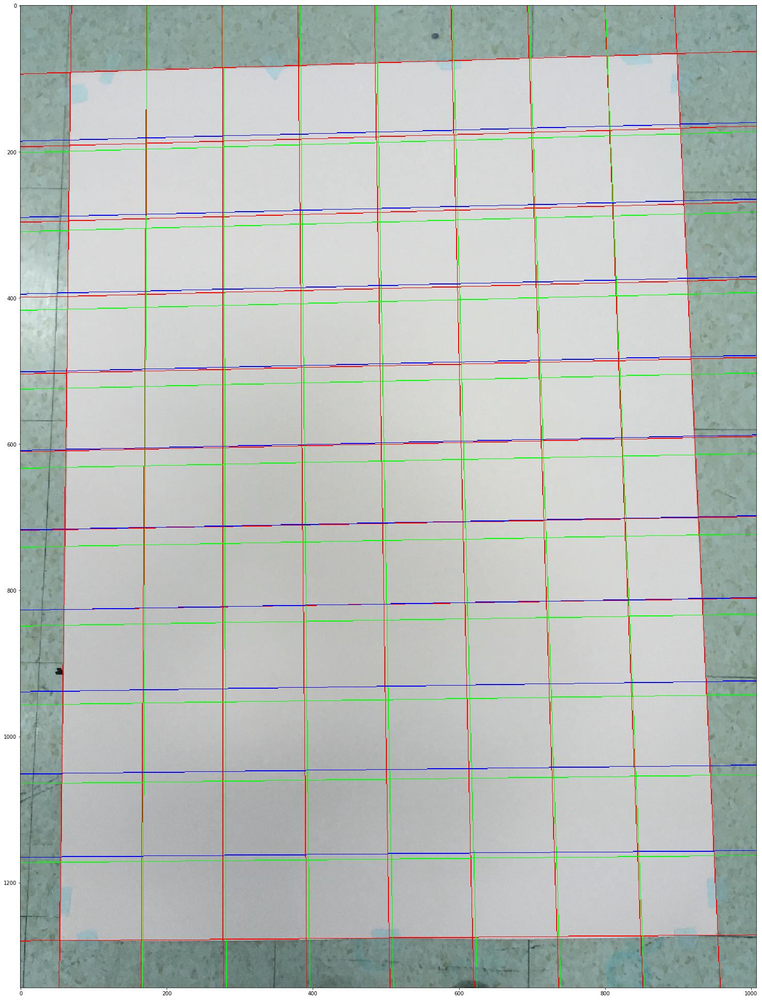

In [488]:
plt.figure(figsize=(35,35))
plt.imshow(small)
plt.show()

In [584]:
nm = cv2.imread("senior/IMG_9508.JPG")


In [585]:
rr=[[659,2819],[953,2821],[1247,2822],[1543,2823]]
ll=[[420,374],[769,376],[1119,379],[1468,382]]
rr=np.array(rr)
ll=np.array(ll)

In [572]:
for i in range(len(rr)-1):
    print(rr[i+1][0]-rr[i][0],ll[i+1][0]-ll[i][0],est_ll[i+1][0]-est_ll[i][0])

294 349 323
294 350 323
296 349 322


In [586]:
ratio = 1/3
small2 = cv2.resize(nm, (0,0), fx=ratio, fy=ratio)

In [587]:
for i in range(len(rr)):
    drawline(rr[i]*ratio,ll[i]*ratio,small2)

In [579]:
brr=[79,373]
trr=[3914,385]
bll=[367,2818]
tll=[3614,2842]

In [588]:
est_ll = []
est_rr = []
est_uu = []
est_dd = []
for i in range(s1//100):
    est_ll.append(divline(tll,bll,(i+1)*100/s1))
    est_rr.append(divline(trr,brr,(i+1)*100/s1))
for i in range(int(s2)//100):
    est_uu.append(divline(tll,trr,(i+1)*100/s2))
    est_dd.append(divline(bll,brr,(i+1)*100/s2))
est_ll=np.array(est_ll)
est_rr=np.array(est_rr)
est_uu=np.array(est_uu)
est_dd=np.array(est_dd)

In [589]:
for i in range(len(est_ll)):
    drawline(est_ll[i]*ratio,est_rr[i]*ratio,small2,[0,255,0])
for i in range(len(est_uu)):
    drawline(est_uu[i]*ratio,est_dd[i]*ratio,small2,[0,255,0])
    

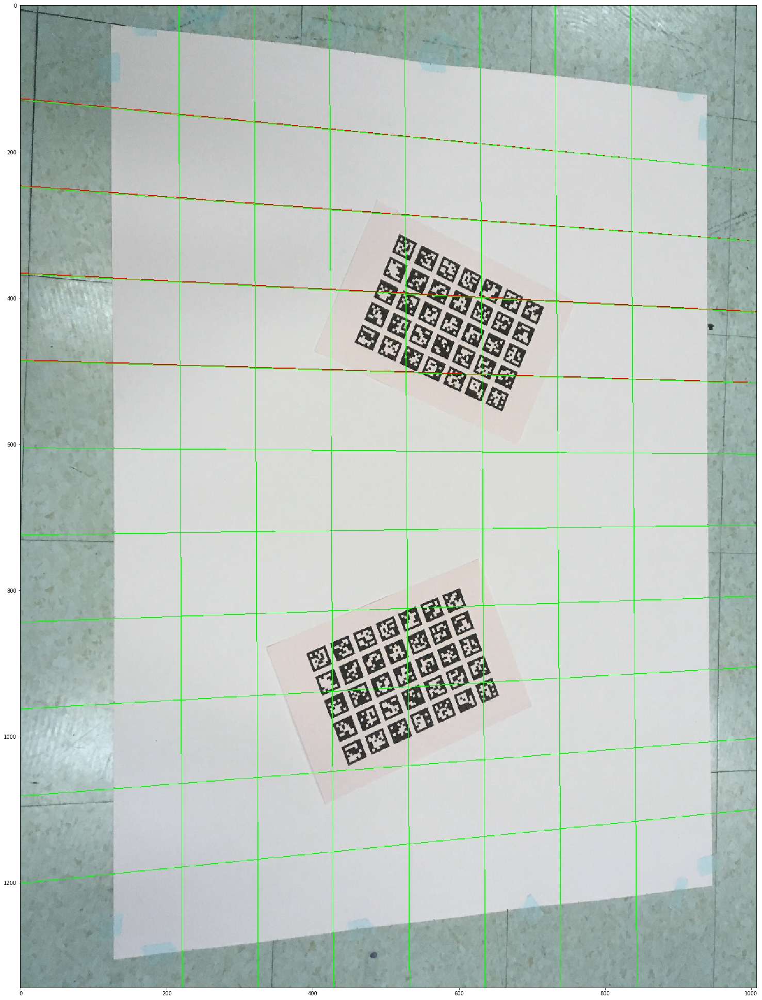

In [590]:

plt.figure(figsize=(35,35))
plt.imshow(small2)
plt.show()

In [554]:
est_ll

[[427, 374],
 [776, 375],
 [1125, 376],
 [1474, 377],
 [1823, 378],
 [2172, 379],
 [2521, 380],
 [2870, 381],
 [3219, 382],
 [3568, 383]]

In [555]:
ll

[[420, 374], [769, 376], [1119, 379], [1468, 382]]